# Pre Test set

x is 224 and y is 224 and z is 11
(50176, 11)


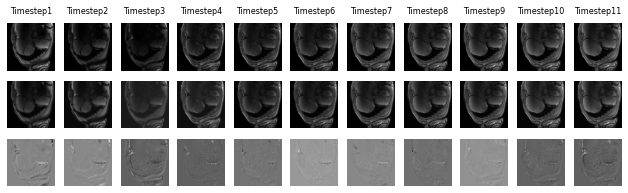

In [12]:
import numpy as np
import glob
import os
import matplotlib.pyplot as plt
from hyperspy.learn.rpca import rpca_godec, orpca
path = 'data/MOLLI_post_dataset/test/0387056_20140423_MOLLI_3.npy'
vols = np.load(path).transpose(1, 2, 0)
x, y, z = vols.shape
print(f"x is {x} and y is {y} and z is {z}")
M = vols.reshape(x*y, z)
print(M.shape)
low, sparse, U, S, V = rpca_godec(M, rank=5)
low_matrix = low.reshape((x, y, z))
sparse_matrix = sparse.reshape((x, y, z))

fig = plt.figure(figsize=(11, 3))
title_font_size=8
title_pad = 10
for i in range(z):
    ax1 = fig.add_subplot(3, 11, 1+i)
    plt.imshow(vols[..., i], cmap='gray')
    plt.axis('off')
    ax1.set_title(f"Timestep{i+1}", fontsize=title_font_size, pad=title_pad)

    ax2 = fig.add_subplot(3, 11, 12+i)
    plt.imshow(low_matrix[..., i], cmap='gray')
    plt.axis('off')

    ax3 = fig.add_subplot(3, 11, 23+i)
    plt.imshow(sparse_matrix[..., i], cmap='gray')
    plt.axis('off')

In [13]:
import pandas as pd
df = pd.DataFrame()
df_2 = pd.DataFrame()

## Test Metrics

### Original volume

#### First Eigen Component percentage

In [14]:
from scripts.utils import *
orig_path = 'data/MOLLI_post_dataset/test'
orig_pca_changes = []
for file in sorted(glob.glob(os.path.join(orig_path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    orig_pca_changes.append(org_dis)
print(f"Mean of original PCA is {np.mean(np.array(orig_pca_changes))}")

Mean of original PCA is 0.8590354716904918


#### T1 fitting

In [15]:
import scipy.io
from pathlib import Path
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

def plot_t1_changes(fig, path, subject_list, orig_t1err_square_list, orig_t1err_heart_list):
    for i, file in enumerate(sorted(glob.glob(os.path.join(path, '*.mat')))):
        subject = Path(file).stem
        subject_list.append(subject)
        fd = scipy.io.loadmat(file)
        SD_err = fd['S']
        areamask = fd['areamask']
        itemindex = np.where(areamask == 1)
        x1, x2 = itemindex[0][0], itemindex[0][-1]
        y1, y2 = itemindex[1][0], itemindex[1][-1]
        heartmask = fd['epi_BW']
        errmap = SD_err * areamask

        orig_t1err_square_list.append(np.mean(errmap[areamask==1]))
        fig.add_subplot(10, 4, 1+i*4)
        ax = plt.gca()
        im = ax.imshow(errmap[x1:x2, y1:y2], cmap='jet', vmin=0, vmax=30)
        ax.axis('off')
        ax.set_title(f"{subject}", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        t1_params_pre = fd['pmap_mse']
        a = t1_params_pre[:, :, 0]
        b = t1_params_pre[:, :, 1]
        c = t1_params_pre[:, :, 2]
        t1map = c * (b - 1)
        fig.add_subplot(10, 4, 2+i*4)
        ax = plt.gca()
        im = ax.imshow(t1map[x1:x2, y1:y2], cmap='jet', vmin=0, vmax=1000)
        ax.axis('off')
        ax.set_title(f"{subject}", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        hearterrmap = SD_err * heartmask
        heartt1map = t1map * heartmask
        orig_t1err_heart_list.append(np.mean(hearterrmap[heartmask==1]))

        fig.add_subplot(10, 4, 3+i*4)
        ax = plt.gca()
        im = ax.imshow(hearterrmap[x1:x2, y1:y2], cmap='jet', vmin=0, vmax=30)
        ax.axis('off')
        ax.set_title(f"{subject}", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        fig.add_subplot(10, 4, 4+i*4)
        ax = plt.gca()
        im = ax.imshow(heartt1map[x1:x2, y1:y2], cmap='jet', vmin=0, vmax=1000)
        ax.axis('off')
        ax.set_title(f"{subject}", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)
    plt.subplots_adjust(left=0.0001,right=0.9, top=0.95, bottom=0.1,)
    return fig, subject_list, orig_t1err_square_list, orig_t1err_heart_list

Mean of t1err is 6.7522509602559895 and std is 2.1794916333878387
Mean of t1err is 5.297546666081299 and std is 1.6881772144802307


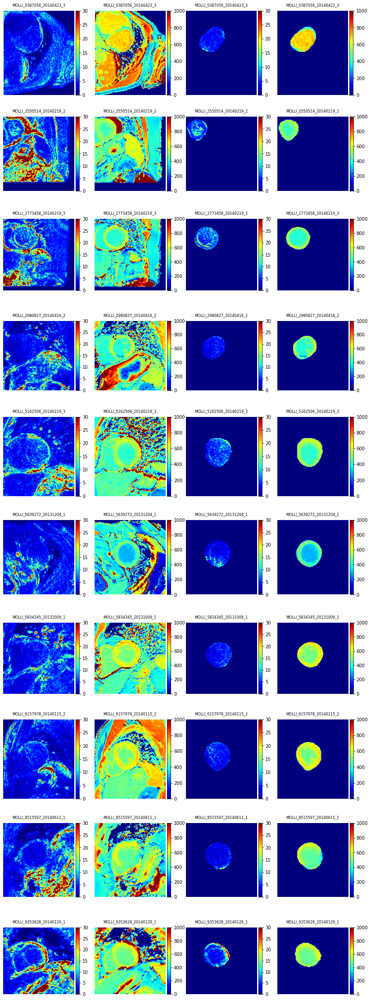

In [16]:
path = "data/MOLLI_post_dataset/T1_SDerr"
# print(path)
fig = plt.figure(figsize=(12,36))
title_font_size=8
title_pad = 10
orig_t1err_square_list = []
orig_t1err_heart_list = []
subject_list = []

fig, subject_list, orig_t1err_square_list, orig_t1err_heart_list = plot_t1_changes(fig, path, subject_list, orig_t1err_square_list, orig_t1err_heart_list)

print(f"Mean of t1err is {np.mean(np.array(orig_t1err_square_list))} and std is {np.std(np.array(orig_t1err_square_list))}")
print(f"Mean of t1err is {np.mean(np.array(orig_t1err_heart_list))} and std is {np.std(np.array(orig_t1err_heart_list))}")
plt.savefig(f"data/MOLLI_post_dataset/T1_SDerr/orig_t1err.png", dpi=300)

df['Cases'] = subject_list
df['Raw Square T1err'] = orig_t1err_square_list
df['Raw Heart T1err'] = orig_t1err_heart_list
df_2['Cases'] = subject_list
df_2['Raw PCA'] = orig_pca_changes

### Round 1

In [17]:
import voxelmorph_group as vxm  # nopep8
import numpy as np
import glob
import os
jacobian = vxm.losses.Jacobian().loss

In [18]:
r = 1
root = f"results/MOLLI_pre/group/rank_11_11_11_11_11_11_11/nmi/smooth/image_loss_weight1/cycle_loss_weight0.01/weight0.001/bspline/cps4_svfsteps7_svfscale1/e80/test_MOLLI_post"
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [19]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 1 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 1 PCA is 0.864257978026535 and std is 0.021408447726175686


#### Jacobian Determination

In [20]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.002129071857780218


#### T1 fitting

Mean of t1err is 6.069000523302336 and std is 1.9437515961977754
Mean of t1err is 4.9175579097242546 and std is 1.5499747763611935


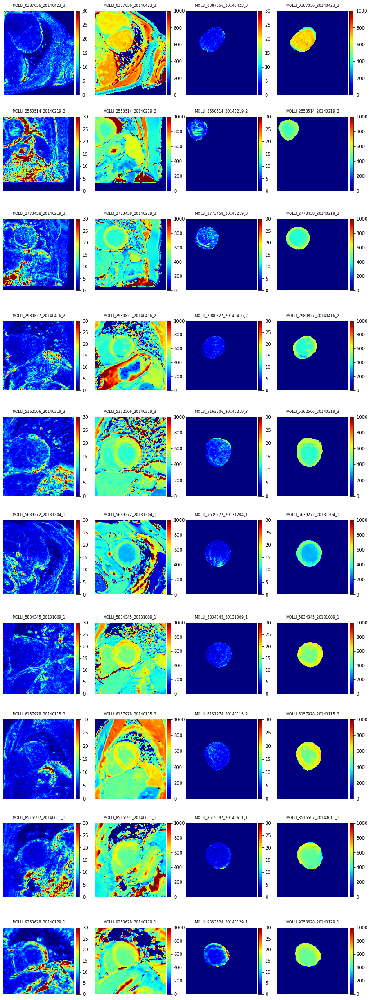

In [21]:
import matplotlib.pyplot as plt

path = f"{base_path}/t1_SDerr"
# print(path)
fig = plt.figure(figsize=(12, 36))
title_font_size=8
title_pad = 10
t1err_square_list = []
t1err_heart_list = []
subject_list = []

fig, subject_list, t1err_square_list, t1err_heart_list = plot_t1_changes(fig, path, subject_list, t1err_square_list, t1err_heart_list)

print(f"Mean of t1err is {np.mean(np.array(t1err_square_list))} and std is {np.std(np.array(t1err_square_list))}")
print(f"Mean of t1err is {np.mean(np.array(t1err_heart_list))} and std is {np.std(np.array(t1err_heart_list))}")
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df['R1 Square T1err'] = t1err_square_list
df['R1 Heart T1err'] = t1err_heart_list
df_2['R1 PCA'] = pca_changes
df_2['R1 Det'] = mag_det_jac_det_list
df_2['R1 Fold ratio'] = folding_ratio_list

In [22]:
t1err_square_list

[4.242215773713246,
 10.398587939618922,
 7.006058963291599,
 4.905837895296111,
 5.962483830464568,
 4.629051657918881,
 4.523088539538287,
 3.9239797422919995,
 7.480144940057526,
 7.618555950832214]

### Round 2

In [23]:
r = 2
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [24]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.8670391286750488 and std is 0.0208220574837762


#### Jacobian Determination

In [25]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.0018081158632412553


#### T1 fitting

Mean of t1err is 5.631745193238023 and std is 1.6966674964158
Mean of t1err is 4.689829796105934 and std is 1.4788803985582375


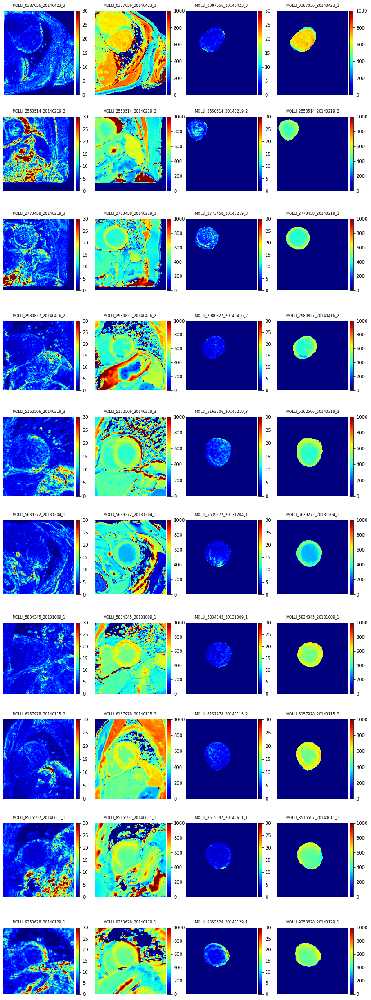

In [26]:
import matplotlib.pyplot as plt

path = f"{base_path}/t1_SDerr"
# print(path)
fig = plt.figure(figsize=(12, 36))
title_font_size=8
title_pad = 10
t1err_square_list = []
t1err_heart_list = []
subject_list = []

fig, subject_list, t1err_square_list, t1err_heart_list = plot_t1_changes(fig, path, subject_list, t1err_square_list, t1err_heart_list)

print(f"Mean of t1err is {np.mean(np.array(t1err_square_list))} and std is {np.std(np.array(t1err_square_list))}")
print(f"Mean of t1err is {np.mean(np.array(t1err_heart_list))} and std is {np.std(np.array(t1err_heart_list))}")
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df['R2 Square T1err'] = t1err_square_list
df['R2 Heart T1err'] = t1err_heart_list
df_2['R2 PCA'] = pca_changes
df_2['R2 Det'] = mag_det_jac_det_list
df_2['R2 Fold ratio'] = folding_ratio_list

### Round 3

In [27]:
r = 3
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [28]:
path = f"{base_path}/moved"
r5_pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    r5_pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(r5_pca_changes))} and std is {np.std(np.array(r5_pca_changes))}")

Mean of Round 2 PCA is 0.8689032898139356 and std is 0.020492388446334577


#### Jacobian Determination

In [29]:
r5_folding_ratio_list = []
r5_mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    r5_folding_ratio_list.append(folding_ratio)
    r5_mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(r5_folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(r5_mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.0015152811538428068


#### T1 fitting

Mean of t1err is 5.396199096895619 and std is 1.5853924446840093
Mean of t1err is 4.4505173366233475 and std is 1.3514138169308065


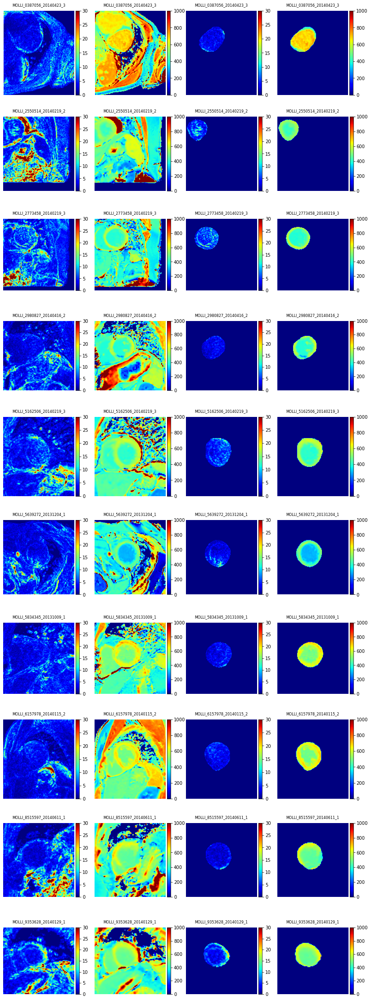

In [30]:
import matplotlib.pyplot as plt

path = f"{base_path}/t1_SDerr"
# print(path)
fig = plt.figure(figsize=(12, 36))
title_font_size=8
title_pad = 10
t1err_square_list = []
t1err_heart_list = []
subject_list = []

fig, subject_list, t1err_square_list, t1err_heart_list = plot_t1_changes(fig, path, subject_list, t1err_square_list, t1err_heart_list)

print(f"Mean of t1err is {np.mean(np.array(t1err_square_list))} and std is {np.std(np.array(t1err_square_list))}")
print(f"Mean of t1err is {np.mean(np.array(t1err_heart_list))} and std is {np.std(np.array(t1err_heart_list))}")
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df['R3 Square T1err'] = t1err_square_list
df['R3 Heart T1err'] = t1err_heart_list
df_2['R3 PCA'] = pca_changes
df_2['R3 Det'] = mag_det_jac_det_list
df_2['R3 Fold ratio'] = folding_ratio_list

### Round 4

In [31]:
r = 4
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [32]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.8702123494042855 and std is 0.02025110325936334


#### Jacobian Determination

In [33]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.001292612636461854


#### T1 fitting

Mean of t1err is 5.277373330380733 and std is 1.5413674801713992
Mean of t1err is 4.319096815973074 and std is 1.3186499731977246


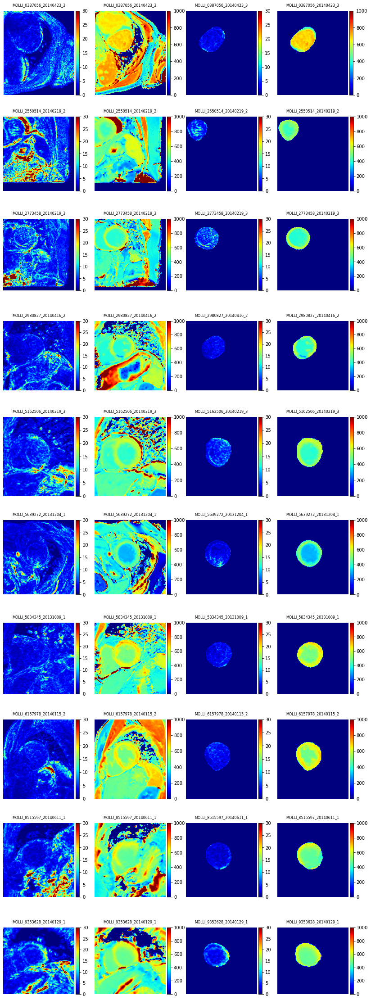

In [34]:
import matplotlib.pyplot as plt

path = f"{base_path}/t1_SDerr"
# print(path)
fig = plt.figure(figsize=(12, 36))
title_font_size=8
title_pad = 10
t1err_square_list = []
t1err_heart_list = []
subject_list = []

fig, subject_list, t1err_square_list, t1err_heart_list = plot_t1_changes(fig, path, subject_list, t1err_square_list, t1err_heart_list)

print(f"Mean of t1err is {np.mean(np.array(t1err_square_list))} and std is {np.std(np.array(t1err_square_list))}")
print(f"Mean of t1err is {np.mean(np.array(t1err_heart_list))} and std is {np.std(np.array(t1err_heart_list))}")
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df['R4 Square T1err'] = t1err_square_list
df['R4 Heart T1err'] = t1err_heart_list
df_2['R4 PCA'] = pca_changes
df_2['R4 Det'] = mag_det_jac_det_list
df_2['R4 Fold ratio'] = folding_ratio_list

### Round 5

In [35]:
r = 5
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [36]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.8714907512217612 and std is 0.020203391510665688


#### Jacobian Determination

In [37]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.0009905279148370028


#### T1 fitting

Mean of t1err is 5.1820224486160145 and std is 1.512205519326658
Mean of t1err is 4.250232133867385 and std is 1.3104910154136502


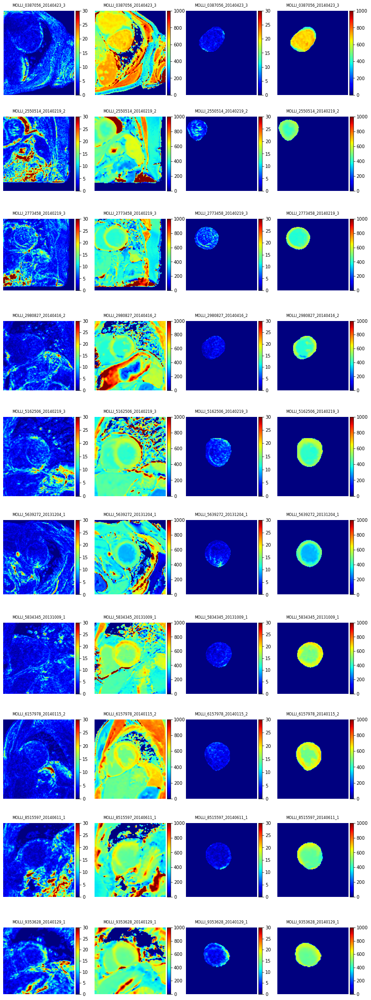

In [38]:
import matplotlib.pyplot as plt

path = f"{base_path}/t1_SDerr"
# print(path)
fig = plt.figure(figsize=(12, 36))
title_font_size=8
title_pad = 10
t1err_square_list = []
t1err_heart_list = []
subject_list = []

fig, subject_list, t1err_square_list, t1err_heart_list = plot_t1_changes(fig, path, subject_list, t1err_square_list, t1err_heart_list)

print(f"Mean of t1err is {np.mean(np.array(t1err_square_list))} and std is {np.std(np.array(t1err_square_list))}")
print(f"Mean of t1err is {np.mean(np.array(t1err_heart_list))} and std is {np.std(np.array(t1err_heart_list))}")
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df['R5 Square T1err'] = t1err_square_list
df['R5 Heart T1err'] = t1err_heart_list
df_2['R5 PCA'] = pca_changes
df_2['R5 Det'] = mag_det_jac_det_list
df_2['R5 Fold ratio'] = folding_ratio_list

### Round 6

In [39]:
r = 6
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [40]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.8720423401182315 and std is 0.02018703028154919


#### Jacobian Determination

In [41]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.0009966687066480517


#### T1 fitting

Mean of t1err is 5.112295725444212 and std is 1.485090873171924
Mean of t1err is 4.179959327571598 and std is 1.2914352340428312


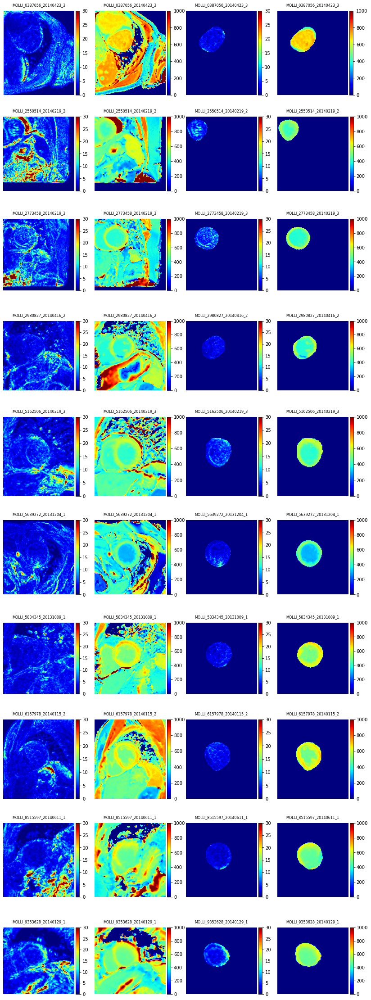

In [42]:
import matplotlib.pyplot as plt

path = f"{base_path}/t1_SDerr"
# print(path)
fig = plt.figure(figsize=(12, 36))
title_font_size=8
title_pad = 10
t1err_square_list = []
t1err_heart_list = []
subject_list = []

fig, subject_list, t1err_square_list, t1err_heart_list = plot_t1_changes(fig, path, subject_list, t1err_square_list, t1err_heart_list)

print(f"Mean of t1err is {np.mean(np.array(t1err_square_list))} and std is {np.std(np.array(t1err_square_list))}")
print(f"Mean of t1err is {np.mean(np.array(t1err_heart_list))} and std is {np.std(np.array(t1err_heart_list))}")
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df['R6 Square T1err'] = t1err_square_list
df['R6 Heart T1err'] = t1err_heart_list
df_2['R6 PCA'] = pca_changes
df_2['R6 Det'] = mag_det_jac_det_list
df_2['R6 Fold ratio'] = folding_ratio_list

### Round 7

In [43]:
r = 7
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [44]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.8726709503488863 and std is 0.02014912914127684


#### Jacobian Determination

In [45]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.0007817975129000843


#### T1 fitting

Mean of t1err is 5.089264095884018 and std is 1.467659434655383
Mean of t1err is 4.17279191594306 and std is 1.2897664642400843


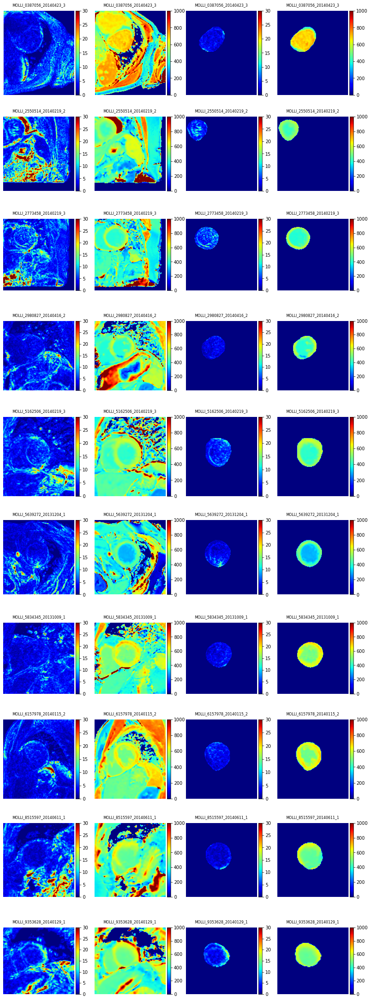

In [46]:
import matplotlib.pyplot as plt

path = f"{base_path}/t1_SDerr"
# print(path)
fig = plt.figure(figsize=(12, 36))
title_font_size=8
title_pad = 10
t1err_square_list = []
t1err_heart_list = []
subject_list = []

fig, subject_list, t1err_square_list, t1err_heart_list = plot_t1_changes(fig, path, subject_list, t1err_square_list, t1err_heart_list)

print(f"Mean of t1err is {np.mean(np.array(t1err_square_list))} and std is {np.std(np.array(t1err_square_list))}")
print(f"Mean of t1err is {np.mean(np.array(t1err_heart_list))} and std is {np.std(np.array(t1err_heart_list))}")
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df['R7 Square T1err'] = t1err_square_list
df['R7 Heart T1err'] = t1err_heart_list
df_2['R7 PCA'] = pca_changes
df_2['R7 Det'] = mag_det_jac_det_list
df_2['R7 Fold ratio'] = folding_ratio_list

### Summary

In [47]:
df

,Cases,Raw Square T1err,Raw Heart T1err,R1 Square T1err,R1 Heart T1err,R2 Square T1err,R2 Heart T1err,R3 Square T1err,R3 Heart T1err,R4 Square T1err,R4 Heart T1err,R5 Square T1err,R5 Heart T1err,R6 Square T1err,R6 Heart T1err,R7 Square T1err,R7 Heart T1err
0,MOLLI_0387056_20140423_3,4.365528,4.276875,4.242216,3.923708,4.231854,3.757984,4.191292,3.525389,4.123754,3.422332,4.074321,3.326205,4.063485,3.305384,4.039674,3.237884
1,MOLLI_2550514_20140219_2,11.222237,7.210080,10.398588,6.714108,9.488101,6.482473,8.989944,5.944325,8.799875,5.895963,8.617116,5.871538,8.487521,5.677867,8.412575,5.616199
2,MOLLI_2773458_20140219_3,7.986917,7.838970,7.006059,6.973193,6.713779,6.859071,6.473523,6.629292,6.315708,6.432142,6.279738,6.363009,6.202785,6.279830,6.174108,6.283830
3,MOLLI_2980827_20140416_2,5.584256,3.600143,4.905838,3.370442,4.514653,3.156671,4.302910,3.109294,4.141391,2.984421,4.052944,2.947903,3.981235,2.884858,3.936615,2.877471
4,MOLLI_5162506_20140219_3,6.906262,6.091785,5.962484,5.782022,5.484610,5.492239,5.321023,5.381750,5.211967,5.268310,5.120290,5.223286,5.039964,5.137819,5.034459,5.113785
5,MOLLI_5639272_20131204_1,4.647820,4.316735,4.629052,3.933222,4.539439,3.837630,4.375893,3.804986,4.373635,3.626209,4.328805,3.588170,4.258536,3.537335,4.314511,3.620614
6,MOLLI_5834345_20131009_1,5.346733,4.101917,4.523089,3.734920,4.120408,3.542681,3.930793,3.446161,3.823314,3.304322,3.698613,3.198546,3.676307,3.138990,3.628473,3.111796
7,MOLLI_6157978_20140115_2,4.345653,4.279712,3.923980,4.143099,3.756791,3.966847,3.621152,3.643997,3.583574,3.570787,3.537391,3.543225,3.483967,3.486645,3.488323,3.508002
8,MOLLI_8515597_20140611_1,8.249505,3.373413,7.480145,3.157787,6.949598,2.973327,6.642576,2.824797,6.467640,2.781293,6.370099,2.713791,6.275951,2.644437,6.222048,2.632390
9,MOLLI_9353628_20140129_1,8.867598,7.885836,7.618556,7.443079,6.518218,6.829373,6.112886,6.195183,5.932874,5.905190,5.740907,5.726649,5.653205,5.706427,5.641854,5.725948


In [48]:
df.describe()

,Raw Square T1err,Raw Heart T1err,R1 Square T1err,R1 Heart T1err,R2 Square T1err,R2 Heart T1err,R3 Square T1err,R3 Heart T1err,R4 Square T1err,R4 Heart T1err,R5 Square T1err,R5 Heart T1err,R6 Square T1err,R6 Heart T1err,R7 Square T1err,R7 Heart T1err
count,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000
mean,6.752251,5.297547,6.069001,4.917558,5.631745,4.689830,5.396199,4.450517,5.277373,4.319097,5.182022,4.250232,5.112296,4.179959,5.089264,4.172792
std,2.297386,1.779495,2.048894,1.633817,1.788445,1.558877,1.671150,1.424515,1.624744,1.389979,1.594005,1.381379,1.565423,1.361292,1.547049,1.359533
min,4.345653,3.373413,3.923980,3.157787,3.756791,2.973327,3.621152,2.824797,3.583574,2.781293,3.537391,2.713791,3.483967,2.644437,3.488323,2.632390
25%,4.822548,4.145657,4.549579,3.782117,4.302554,3.596507,4.219196,3.465968,4.128163,3.333824,4.058288,3.230460,4.001797,3.180589,3.962380,3.143318
50%,6.245259,4.298224,5.434161,4.038161,5.012025,3.902239,4.848458,3.724491,4.792801,3.598498,4.724548,3.565698,4.649250,3.511990,4.674485,3.564308
75%,8.183858,6.930506,7.361623,6.481086,6.664889,6.234915,6.383364,5.803681,6.220000,5.739050,6.145030,5.600808,6.065390,5.542855,6.041045,5.490595
max,11.222237,7.885836,10.398588,7.443079,9.488101,6.859071,8.989944,6.629292,8.799875,6.432142,8.617116,6.363009,8.487521,6.279830,8.412575,6.283830


In [49]:
df['R7/Raw Square %'] = (df['Raw Square T1err'] - df['R7 Square T1err']) / df['Raw Square T1err']
df['R7/Raw Heart %'] = (df['Raw Heart T1err'] - df['R7 Heart T1err']) / df['Raw Heart T1err']
df['R1/Raw Heart %'] = (df['Raw Heart T1err'] - df['R1 Heart T1err']) / df['Raw Heart T1err']
df['R2/Raw Heart %'] = (df['Raw Heart T1err'] - df['R2 Heart T1err']) / df['Raw Heart T1err']
df['R3/Raw Heart %'] = (df['Raw Heart T1err'] - df['R3 Heart T1err']) / df['Raw Heart T1err']
df['R4/Raw Heart %'] = (df['Raw Heart T1err'] - df['R4 Heart T1err']) / df['Raw Heart T1err']
df['R5/Raw Heart %'] = (df['Raw Heart T1err'] - df['R5 Heart T1err']) / df['Raw Heart T1err']
df['R6/Raw Heart %'] = (df['Raw Heart T1err'] - df['R6 Heart T1err']) / df['Raw Heart T1err']
df['R7/Raw Heart %'] = (df['Raw Heart T1err'] - df['R7 Heart T1err']) / df['Raw Heart T1err']
df.describe()

,Raw Square T1err,Raw Heart T1err,R1 Square T1err,R1 Heart T1err,R2 Square T1err,R2 Heart T1err,R3 Square T1err,R3 Heart T1err,R4 Square T1err,R4 Heart T1err,...,R7 Square T1err,R7 Heart T1err,R7/Raw Square %,R7/Raw Heart %,R1/Raw Heart %,R2/Raw Heart %,R3/Raw Heart %,R4/Raw Heart %,R5/Raw Heart %,R6/Raw Heart %
count,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,...,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000
mean,6.752251,5.297547,6.069001,4.917558,5.631745,4.689830,5.396199,4.450517,5.277373,4.319097,...,5.089264,4.172792,0.231796,0.210018,0.070676,0.114184,0.156245,0.181449,0.195039,0.208691
std,2.297386,1.779495,2.048894,1.633817,1.788445,1.558877,1.671150,1.424515,1.624744,1.389979,...,1.547049,1.359533,0.096066,0.036954,0.022630,0.019070,0.029139,0.030490,0.036327,0.033196
min,4.345653,3.373413,3.923980,3.157787,3.756791,2.973327,3.621152,2.824797,3.583574,2.781293,...,3.488323,2.632390,0.071713,0.160544,0.031921,0.073104,0.116556,0.135178,0.142569,0.156599
25%,4.822548,4.145657,4.549579,3.782117,4.302554,3.596507,4.219196,3.465968,4.128163,3.333824,...,3.962380,3.143318,0.204706,0.184835,0.058060,0.103433,0.139391,0.166993,0.174359,0.188652
50%,6.245259,4.298224,5.434161,4.038161,5.012025,3.902239,4.848458,3.724491,4.792801,3.598498,...,4.674485,3.564308,0.248066,0.210200,0.066354,0.119962,0.157091,0.177496,0.186967,0.205703
75%,8.183858,6.930506,7.361623,6.481086,6.664889,6.234915,6.383364,5.803681,6.220000,5.739050,...,6.041045,5.490595,0.289046,0.236301,0.087276,0.124548,0.172322,0.191399,0.214058,0.224386
max,11.222237,7.885836,10.398588,7.443079,9.488101,6.859071,8.989944,6.629292,8.799875,6.432142,...,8.412575,6.283830,0.363768,0.273895,0.110445,0.136335,0.214391,0.251165,0.273806,0.276370


In [50]:
df_2

,Cases,Raw PCA,R1 PCA,R1 Det,R1 Fold ratio,R2 PCA,R2 Det,R2 Fold ratio,R3 PCA,R3 Det,...,R4 Fold ratio,R5 PCA,R5 Det,R5 Fold ratio,R6 PCA,R6 Det,R6 Fold ratio,R7 PCA,R7 Det,R7 Fold ratio
0,MOLLI_0387056_20140423_3,0.882389,0.885655,0.001846,0.0,0.888095,0.001600,0.0,0.888095,0.001600,...,0.0,0.891842,0.000972,0.0,0.892473,0.000889,0.0,0.893110,0.000715,0.0
1,MOLLI_2550514_20140219_2,0.835710,0.844353,0.002326,0.0,0.848786,0.001852,0.0,0.848786,0.001852,...,0.0,0.855559,0.000941,0.0,0.856082,0.000932,0.0,0.856745,0.000823,0.0
2,MOLLI_2773458_20140219_3,0.865327,0.871676,0.002119,0.0,0.875314,0.001904,0.0,0.875314,0.001904,...,0.0,0.880808,0.001042,0.0,0.881542,0.001052,0.0,0.882409,0.000807,0.0
3,MOLLI_2980827_20140416_2,0.871994,0.875317,0.002040,0.0,0.878150,0.001744,0.0,0.878150,0.001744,...,0.0,0.881835,0.000938,0.0,0.882402,0.001030,0.0,0.882849,0.000758,0.0
4,MOLLI_5162506_20140219_3,0.867819,0.874153,0.002143,0.0,0.876554,0.001910,0.0,0.876554,0.001910,...,0.0,0.880757,0.000997,0.0,0.881073,0.001047,0.0,0.881949,0.000789,0.0
5,MOLLI_5639272_20131204_1,0.860272,0.863947,0.001962,0.0,0.866204,0.001832,0.0,0.866204,0.001832,...,0.0,0.870493,0.001086,0.0,0.871128,0.000961,0.0,0.871525,0.000777,0.0
6,MOLLI_5834345_20131009_1,0.840623,0.847527,0.002285,0.0,0.850424,0.001886,0.0,0.850424,0.001886,...,0.0,0.854553,0.001002,0.0,0.855125,0.001006,0.0,0.855810,0.000773,0.0
7,MOLLI_6157978_20140115_2,0.899037,0.901128,0.001822,0.0,0.902088,0.001672,0.0,0.902088,0.001672,...,0.0,0.904951,0.000871,0.0,0.905418,0.000943,0.0,0.905770,0.000732,0.0
8,MOLLI_8515597_20140611_1,0.815625,0.822385,0.002485,0.0,0.825713,0.001929,0.0,0.825713,0.001929,...,0.0,0.830740,0.001035,0.0,0.831355,0.001085,0.0,0.831960,0.000847,0.0
9,MOLLI_9353628_20140129_1,0.851559,0.856438,0.002261,0.0,0.859064,0.001752,0.0,0.859064,0.001752,...,0.0,0.863371,0.001023,0.0,0.863826,0.001021,0.0,0.864581,0.000799,0.0


In [51]:
df2 = df_2.drop(['R1 Fold ratio', 'R2 Fold ratio', 'R3 Fold ratio', 'R4 Fold ratio', 'R5 Fold ratio', 'R6 Fold ratio', 'R7 Fold ratio'], axis=1)
df2['R1/Raw PCA %'] = (df2['R1 PCA'] - df2['Raw PCA']) / df2['Raw PCA']
df2['R2/Raw PCA %'] = (df2['R2 PCA'] - df2['Raw PCA']) / df2['Raw PCA']
df2['R3/Raw PCA %'] = (df2['R3 PCA'] - df2['Raw PCA']) / df2['Raw PCA']
df2['R4/Raw PCA %'] = (df2['R4 PCA'] - df2['Raw PCA']) / df2['Raw PCA']
df2['R5/Raw PCA %'] = (df2['R5 PCA'] - df2['Raw PCA']) / df2['Raw PCA']
df2['R6/Raw PCA %'] = (df2['R6 PCA'] - df2['Raw PCA']) / df2['Raw PCA']
df2['R7/Raw PCA %'] = (df2['R7 PCA'] - df2['Raw PCA']) / df2['Raw PCA']
df2.describe()

,Raw PCA,R1 PCA,R1 Det,R2 PCA,R2 Det,R3 PCA,R3 Det,R4 PCA,R4 Det,R5 PCA,...,R6 Det,R7 PCA,R7 Det,R1/Raw PCA %,R2/Raw PCA %,R3/Raw PCA %,R4/Raw PCA %,R5/Raw PCA %,R6/Raw PCA %,R7/Raw PCA %
count,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,...,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000
mean,0.859035,0.864258,0.002129,0.867039,0.001808,0.867039,0.001808,0.870212,0.001293,0.871491,...,0.000997,0.872671,0.000782,0.006132,0.009391,0.009391,0.013107,0.014598,0.015241,0.015975
std,0.024164,0.022566,0.000215,0.021948,0.000112,0.021948,0.000112,0.021347,0.000068,0.021296,...,0.000062,0.021239,0.000040,0.002559,0.003571,0.003571,0.004565,0.004858,0.004893,0.005028
min,0.815625,0.822385,0.001822,0.825713,0.001600,0.825713,0.001600,0.829740,0.001190,0.830740,...,0.000889,0.831960,0.000715,0.002326,0.003393,0.003393,0.005555,0.006578,0.007097,0.007489
25%,0.843357,0.849755,0.001982,0.852584,0.001746,0.852584,0.001746,0.855777,0.001243,0.857512,...,0.000947,0.858704,0.000762,0.003926,0.006936,0.006936,0.009977,0.011434,0.012106,0.012607
50%,0.862800,0.867812,0.002131,0.870759,0.001842,0.870759,0.001842,0.874178,0.001303,0.875625,...,0.001014,0.876737,0.000783,0.006514,0.009439,0.009439,0.013174,0.014389,0.014839,0.015787
75%,0.870950,0.875026,0.002279,0.877751,0.001900,0.877751,0.001900,0.880340,0.001326,0.881578,...,0.001042,0.882739,0.000805,0.007994,0.011630,0.011630,0.015701,0.017560,0.018367,0.019322
max,0.899037,0.901128,0.002485,0.902088,0.001929,0.902088,0.001929,0.904031,0.001416,0.904951,...,0.001085,0.905770,0.000847,0.010342,0.015646,0.015646,0.021380,0.023750,0.024377,0.025170


In [52]:
df_det = df_2[['R1 Det', 'R2 Det', 'R3 Det', 'R4 Det', 'R5 Det', 'R6 Det', 'R7 Det']]
df_det.describe()

,R1 Det,R2 Det,R3 Det,R4 Det,R5 Det,R6 Det,R7 Det
count,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000
mean,0.002129,0.001808,0.001808,0.001293,0.000991,0.000997,0.000782
std,0.000215,0.000112,0.000112,0.000068,0.000062,0.000062,0.000040
min,0.001822,0.001600,0.001600,0.001190,0.000871,0.000889,0.000715
25%,0.001982,0.001746,0.001746,0.001243,0.000948,0.000947,0.000762
50%,0.002131,0.001842,0.001842,0.001303,0.000999,0.001014,0.000783
75%,0.002279,0.001900,0.001900,0.001326,0.001032,0.001042,0.000805
max,0.002485,0.001929,0.001929,0.001416,0.001086,0.001085,0.000847
